In [1]:
# python libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()


In [2]:
import os
os.chdir('C:\\Analytics\\MachineLearning\\suiside rate in india')

In [3]:
data = pd.read_csv('Suicides in India 2001-2012.csv')

In [4]:
data.columns

Index(['State', 'Year', 'Type_code', 'Type', 'Gender', 'Age_group', 'Total'], dtype='object')

In [5]:
data.head(5)

,State,Year,Type_code,Type,Gender,Age_group,Total
0,A & N Islands,2001,Causes,Illness (Aids/STD),Female,0-14,0
1,A & N Islands,2001,Causes,Bankruptcy or Sudden change in Economic,Female,0-14,0
2,A & N Islands,2001,Causes,Cancellation/Non-Settlement of Marriage,Female,0-14,0
3,A & N Islands,2001,Causes,Physical Abuse (Rape/Incest Etc.),Female,0-14,0
4,A & N Islands,2001,Causes,Dowry Dispute,Female,0-14,0


In [6]:
data.describe()

,Year,Total
count,237519.000000,237519.000000
mean,2006.500448,55.034477
std,3.452240,792.749038
min,2001.000000,0.000000
25%,2004.000000,0.000000
50%,2007.000000,0.000000
75%,2010.000000,6.000000
max,2012.000000,63343.000000


In [7]:
data.isnull().any() # to check missing values

State        False
Year         False
Type_code    False
Type         False
Gender       False
Age_group    False
Total        False
dtype: bool

In [8]:
# data preprocessing and modification
data.drop(data.index[209476:210412],inplace=True) # deleting some rows having redundant values
data.count()

State        236583
Year         236583
Type_code    236583
Type         236583
Gender       236583
Age_group    236583
Total        236583
dtype: int64

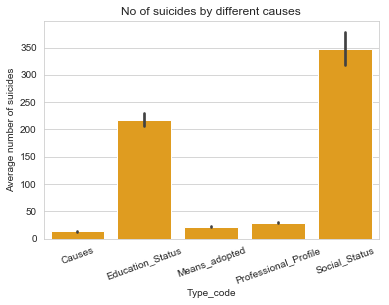

In [9]:
# Barplot - showing the avg number of suicides by different causes 

sns.set_style('whitegrid')
sns.barplot(x='Type_code',y='Total',data=data,color='orange').set_title('No of suicides by different causes')
plt.xticks(rotation=20)
plt.ylabel('Average number of suicides')
plt.show()

Text(0, 0.5, 'Average number of suicides')

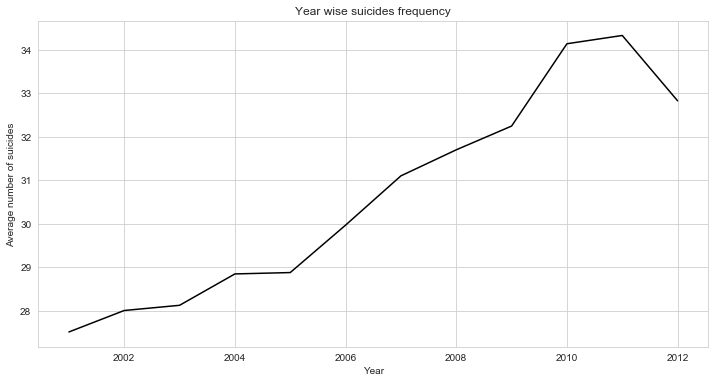

In [10]:
data.groupby('Year').mean()['Total'].plot(figsize=(12,6),title='Year wise suicides frequency',
                                         colormap='cubehelix')
plt.ylabel('Average number of suicides')

From the graph we can see as the number of years growing the suicides rate incrases.

Text(0.5, 0, 'Average number of suicides')

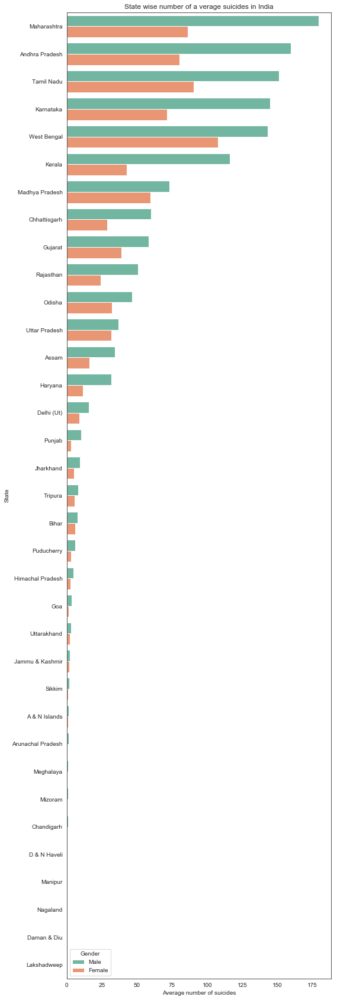

In [13]:
# State-wise analysis of suicide's frequency rate
data1 = data.groupby(['State','Gender'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
sns.set_style('white')
plt.subplots(figsize=(8,30))
g = sns.barplot(y=data1['State'], x= 'Total', data=data1,hue='Gender',palette='Set2').set_title('State wise number of a verage suicides in India')
plt.xlabel('Average number of suicides')

Hence Top 5 states with highest number of frequency
1. Maharastra
2. West Bengal
3. Tamil Nadu
4. Andhra Pradesh
5. Karnataka

Another thing from graph that gender having male, has highest number of suicides

In [14]:
# Plotting heat map for top5 states
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import tools
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode()

a1 = data.loc[data.State=='Maharastra']
a2 = data.loc[data.State=='Andhra Pradesh']
a3 = data.loc[data.State=='Tamil Nadu']
a4 = data.loc[data.State=='Karnataka']
a5 = data.loc[data.State=='West Bengal']

a1 = a1.append(a2)
a1 = a1.append(a3)
a1 = a1.append(a4)
a1 = a1.append(a5)

trace = go.Heatmap(z = a1['Total'],
                   x = a1['Year'],
                   y = a1['State'])

d = [trace]
figure = dict(data=d)
iplot(figure)

Text(0.5, 0, 'Average number of suicides')

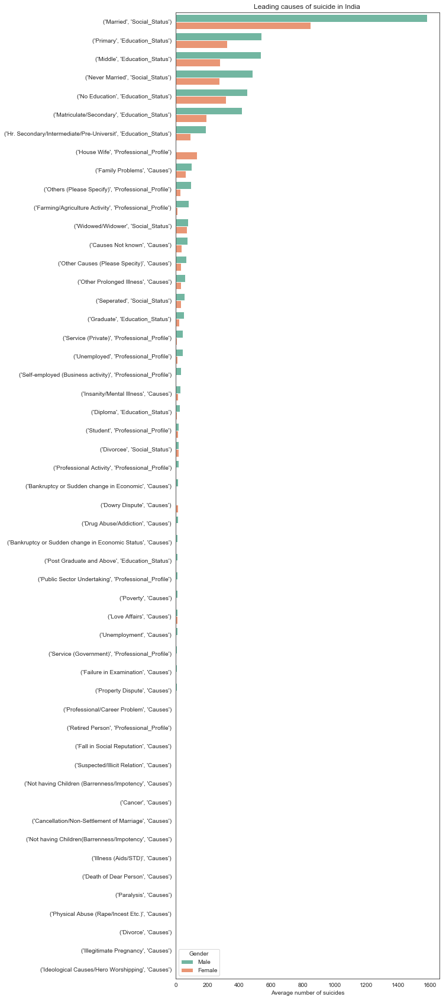

In [16]:
# what are the leading causes 

data1=data.loc[data.Type_code!='Means_adopted']
data1=data1.groupby(['Type','Type_code','Gender'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
data1.set_index(['Type','Type_code'])
data1=data1.set_index(['Type','Type_code'])
sns.set_style('white')
plt.subplots(figsize=(8,30))
g = sns.barplot(y=data1.index,x='Total',data=data1,palette="Set2",hue='Gender').set_title('Leading causes of suicide in India ')
plt.xlabel('Average number of suicides')

Its seems marriage causes highest among suicide cause, male is having highest in number as compared to female.

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 <a list of 17 Text xticklabel objects>)

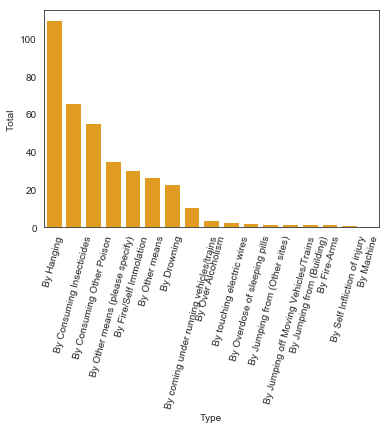

In [17]:
# which are adopted for suicide
means = data.loc[data.Type_code =='Means_adopted']
s = means.groupby(['Type'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
sns.barplot(x='Type',y='Total',data=s,color='orange')
plt.xticks(rotation=75)

Hanging is the most means of committing suicides

Text(0.5, 1.0, 'Percentage of male and female suicide in india')

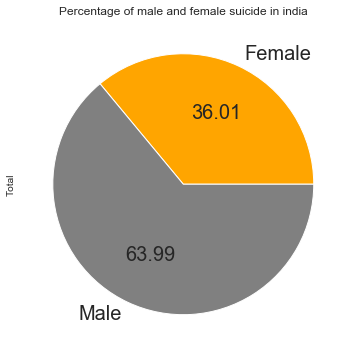

In [19]:
# suicides based on gender
s = data.groupby(['Gender'])['Total'].mean()
s.plot.pie(colors=['orange', 'grey'],autopct='%.2f', fontsize=20, figsize=(6, 6))
plt.title('Percentage of male and female suicide in india')

It shows male having nearly 64% cases of suicides

Text(0, 0.5, 'Average no of suicides')

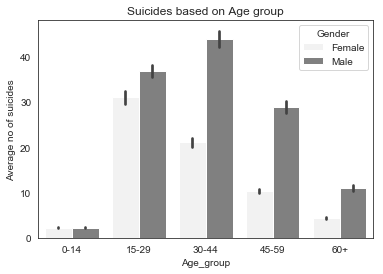

In [21]:
# which age group
data2 = data[data['Age_group']!='0-100+'] # excluding the age group of 0-100+ due to redundency
sns.barplot(x='Age_group',y='Total',hue='Gender',data=data2,color='grey').set_title('Suicides based on Age group')
plt.ylabel('Average no of suicides')

Age group 30 to 44 having highest rate of suicides may be due to high mental pressure, preofesional personal life imbalance.

Text(0.5, 0, 'Suicide rate')

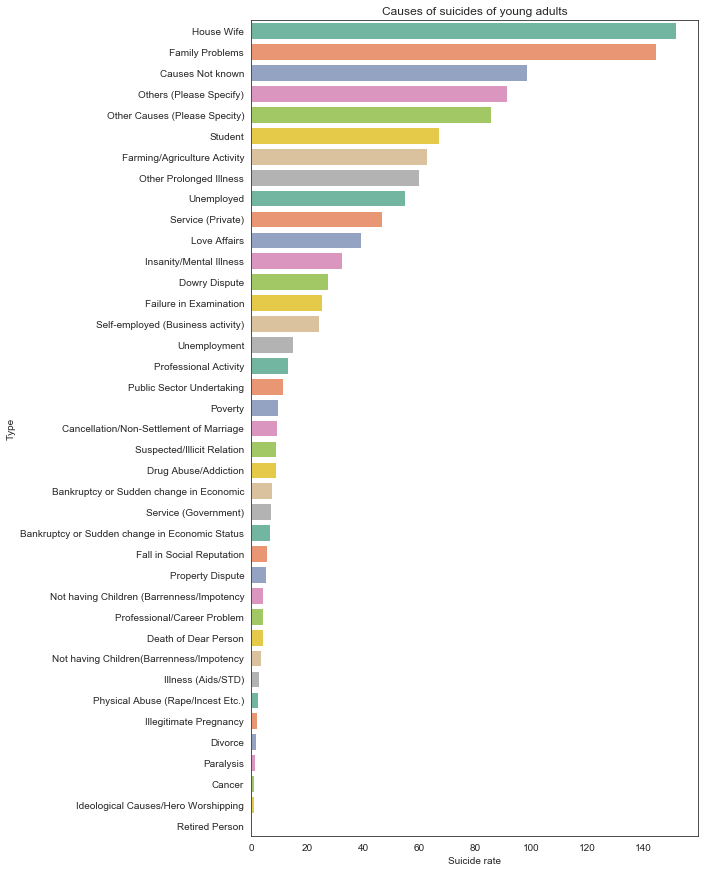

In [22]:
# suicide among yougstars between 15 to 29
agegroup = data[data['Age_group'] != '0-100+']

adults = data.loc[data.Age_group=='15-29']
adults1 = adults.loc[adults.Type_code != 'Means_adopted']
young1 = adults1.groupby(['Type'])['Total'].mean().reset_index().sort_values('Total',ascending=False)

plt.subplots(figsize=(8,15))
sns.barplot(x='Total', y='Type', data=young1,palette='Set2').set_title('Causes of suicides of young adults')
plt.xlabel('Suicide rate')

It seems like house wifes are most vulnerable and hence commit suicide... House wife's needs a lot of therapies for overcoming anxiety and depression..

In [23]:
# Child committing suicide
child = data.loc[data.Age_group=='0-14']
child1 = child.groupby(['State'])['Total'].sum().reset_index().sort_values('Total',ascending=False)
child1[0:5]

,State,Total
34,West Bengal,15538
1,Andhra Pradesh,9795
16,Karnataka,9654
30,Tamil Nadu,9615
19,Madhya Pradesh,9030


West Bengal tops in the child suicide rate ...followed by AP, Karnataka and Tamil Nadu

Text(0.5, 0, 'average no of child suicide')

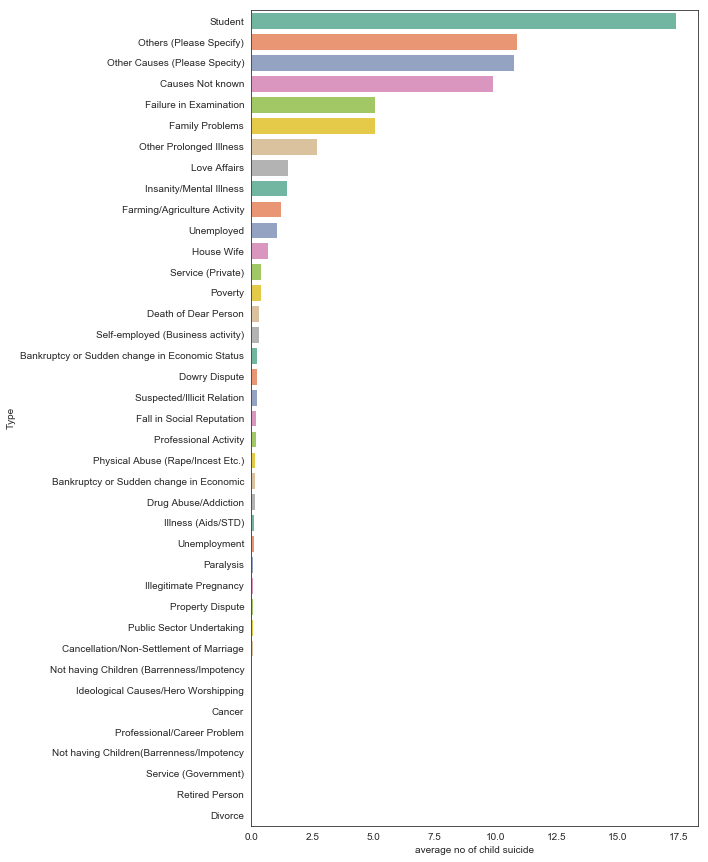

In [24]:
# Main causes in children's suicide
child = data.loc[data.Age_group=='0-14']
child1 = child.loc[child.Type_code!='Means_adopted']
child1 = child1.groupby(['Type'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
plt.subplots(figsize=(8,15))
sns.barplot(x='Total',y='Type',data=child1,palette='Set2')
plt.xlabel('average no of child suicide')

No time to play??? looks like children commit suicides more often and reason behind this could be...

1.failure in exam
2.depression
3.not able to meet the expectations of parents
4.school's failure for overburdening the children with exam pressure 

In [25]:
# over-age reason to commit to suicide
oldage = data.loc[data.Age_group=='60+']
oldage2 = oldage.groupby(['State'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
oldage2[0:5]

,State,Total
17,Kerala,46.074074
20,Maharashtra,34.122685
30,Tamil Nadu,33.971406
16,Karnataka,30.736111
1,Andhra Pradesh,29.498069


Text(0.5, 0, 'average no of suicide')

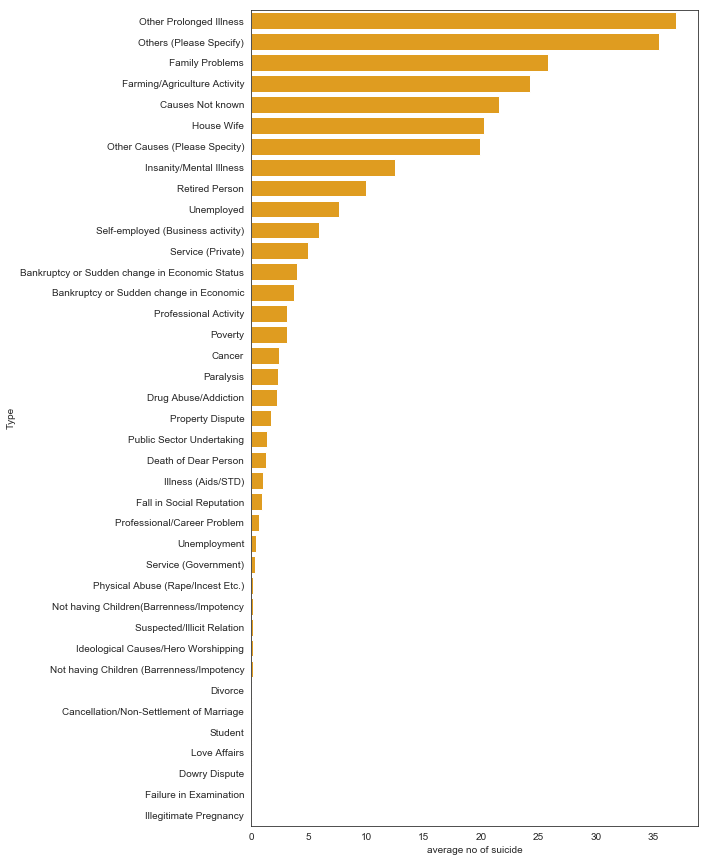

In [26]:
# barplot of old age 
oldage1 = oldage.loc[oldage.Type_code != 'Means_adopted']
oldage2 = oldage1.groupby(['Type'])['Total'].mean().reset_index().sort_values('Total',ascending=False)

plt.subplots(figsize=(8,15))
sns.barplot(x='Total',y='Type',data=oldage2,color='orange')
plt.xlabel('average no of suicide')

old people commit suicide due to long term illness. one of the reason 

Text(0.5, 0, 'average no of suicide')

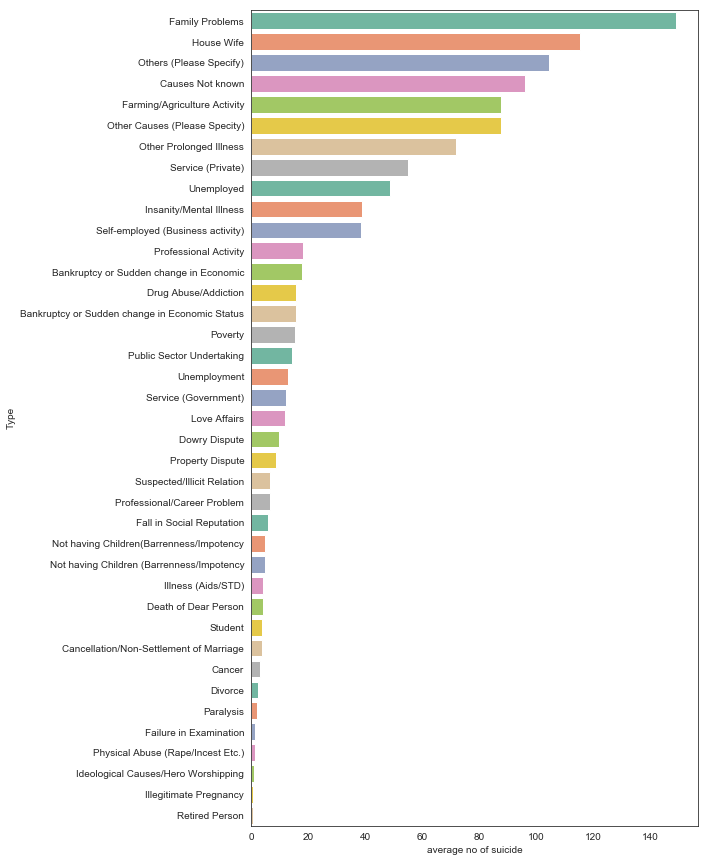

In [27]:
# Generation (30-44) suicide
a= data.loc[data.Age_group =='30-44']
a1 = a.loc[a.Type_code != 'Means_adopted']
a2 = a1.groupby(['Type'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
plt.subplots(figsize=(8,15))
sns.barplot(x='Total',y='Type', data=a2,palette='Set2')
plt.xlabel('average no of suicide')

It seems Family Problems are the major reason in indian society

In [28]:
# Poverty cause suicide

Poverty = data.loc[data.Type=='Poverty']
Poverty1 = Poverty.groupby(['State'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
Poverty2 = Poverty1[0:5]

labels = Poverty2['State']
values = Poverty2['Total']
trace = go.Pie(labels=labels,values=values)
d1 = [trace]
figure = dict(data=d1)
iplot(figure)

Andhara Pradesh having highest poverty rate

In [29]:
# unemployment cause of suicide
data.replace('Unemployment','Unemployed',inplace=True)
unemployment=data.loc[(data.Type=='Unemployed')] 
unemployment1=unemployment.groupby(['State'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
unemployment2=unemployment1[0:5]



labels = unemployment2['State']
values = unemployment2['Total']
trace = go.Pie(labels=labels, values=values)
d2=[trace]
figure = dict(data = d2)
iplot(figure)

Tamil Nadu having highest no of unemployment followed by West Bengal

In [30]:
abuse=data.loc[(data.Type=='Love Affairs')] 
abuse1=abuse.groupby(['State'])['Total'].mean().reset_index().sort_values('Total',ascending=False)
abuse2=abuse1[0:5]

labels = abuse2['State']
values = abuse2['Total']
trace = go.Pie(labels=labels, values=values)
d3=[trace]
figure = dict(data = d3)
iplot(figure)

West Bengal having highest no of suicides due to love affairs followed by Tamil Nadu

In [31]:
# heatmap showing the realtion between the causes of suicide and year wise suicide 
# frequency of top 5 states in suicide rate


a1=data.loc[data.State=='Maharashtra']
a2=data.loc[data.State=='Andhra Pradesh']
a3=data.loc[data.State=='Tamil Nadu']
a4=data.loc[data.State=='Karnataka']
a5=data.loc[data.State=='West Bengal']

a1=a1.append(a2)
a1=a1.append(a3)
a1=a1.append(a4)
a1=a1.append(a5)

s = a1.groupby(['Type','Year'])['Total'].mean().reset_index().sort_values('Total',ascending=False)

trace = go.Heatmap(z=s['Total'],
                   x=s['Year'],
                   y=s['Type'])
d=[trace]
figure = dict(data = d)
iplot(figure)
